# Mission Statment from kaggel
With growing demands and cut-throat competition in the market, a Superstore Giant is seeking your knowledge in understanding what works best for them. They would like to understand which products, regions, categories and customer segments they should target or avoid.

You can even take this a step further and try and build a Regression model to predict Sales or Profit.

Go crazy with the dataset, but also make sure to provide some business insights to improve.



In [1]:
%matplotlib inline
!pip install sqlalchemy==1.3.9
!pip install ipython-sql
!pip install --upgrade ipython

  Using cached SQLAlchemy-1.3.9-cp311-cp311-win_amd64.whl
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 2.0.22
    Uninstalling SQLAlchemy-2.0.22:
      Successfully uninstalled SQLAlchemy-2.0.22


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\Admin\\anaconda3\\Lib\\site-packages\\~~lalchemy\\cyextension\\collections.cp311-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



  Using cached SQLAlchemy-2.0.22-cp311-cp311-win_amd64.whl (2.1 MB)
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 1.3.9
    Uninstalling SQLAlchemy-1.3.9:
      Successfully uninstalled SQLAlchemy-1.3.9


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import LabelEncoder,OneHotEncoder,StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import jaccard_score,log_loss,f1_score,confusion_matrix, accuracy_score
from plotly.subplots import make_subplots
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import plotly.graph_objects as go
import datetime
import numpy as np
import seaborn as sns
import plotly.express as px
from sklearn import tree
import folium
import sqlite3, csv

In [3]:
def plot_confusion_matrix(y,y_predict):
    "this function plots the confusion matrix"
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['no Profit', 'Profit']); ax.yaxis.set_ticklabels(['no Profit', 'Profit']) 
    plt.show() 

### Data analysis of Superstore sales
Hello my name is Flynn Fayman and I'm doing a data analysis of a Superstore sales.
-  Frist I will do some feature engineering and data cleaning
-  Seconed I will visualize the data to try to determine if there are any correlations between features
- Third I will train several different models and try to determine what fits best to the data to predict profit and sales
- Fourth I will summarize my analysis and make suggestions on what the company should focus on in terms of resources as to gain the most profit 




In [4]:
# Loading the Data and Gaing info on shape a feature type of the Data Set

In [5]:
RawSales = pd.read_csv('Superstore.csv',encoding='windows-1252')

In [6]:
RawSales.shape

(9994, 21)

In [7]:
RawSales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9994 non-null   int64  
 1   Order ID       9994 non-null   object 
 2   Order Date     9994 non-null   object 
 3   Ship Date      9994 non-null   object 
 4   Ship Mode      9994 non-null   object 
 5   Customer ID    9994 non-null   object 
 6   Customer Name  9994 non-null   object 
 7   Segment        9994 non-null   object 
 8   Country        9994 non-null   object 
 9   City           9994 non-null   object 
 10  State          9994 non-null   object 
 11  Postal Code    9994 non-null   int64  
 12  Region         9994 non-null   object 
 13  Product ID     9994 non-null   object 
 14  Category       9994 non-null   object 
 15  Sub-Category   9994 non-null   object 
 16  Product Name   9994 non-null   object 
 17  Sales          9994 non-null   float64
 18  Quantity

### Feature Engineering & Data Cleaing
-  Chaing Order Date Type into Numpy Date Time
-  Adding features:
    - SalesXDiscount = Sales * Discount
    - SalesAndDiscountDiff = Sales - SalesXDiscount
    - Cost = Sales - Profit
    - ProfitLabel is a categorical variable defined as no-profit or profit, based on the wheater or not profit feature is less than or equal to zero or postive

In [8]:
RawSales['Order Date']

0       09-11-2013
1       09-11-2013
2       13-06-2013
3       11-10-2012
4       11-10-2012
           ...    
9989    22-01-2011
9990    27-02-2014
9991    27-02-2014
9992    27-02-2014
9993    05-05-2014
Name: Order Date, Length: 9994, dtype: object

In [9]:
RawSales['Order Date'] = pd.to_datetime(RawSales['Order Date'],dayfirst = True)

In [10]:
RawSales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   object        
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [11]:
RawSales['DiscountXSales'] = RawSales['Discount']*RawSales['Sales']
RawSales['SalesAndDiscountDiff'] = RawSales['Sales']-RawSales['DiscountXSales']
RawSales['Cost'] = RawSales['Sales'] - RawSales['Profit']
RawSales['ProfitLabel'] = pd.cut(RawSales['Profit'], bins = [-2000000,0,2000000],labels = ['No-Profit',"Profit"])

## Data Visualization
-  Creating histograms of continuous values Sales, Quantity, Profit, and Discount from the data set
    -  Had to eliminate outliers in both profit and sales to get an more accurate histogram
-  Visualize the count of categorical values, city, state, Ship mode, subcategory and Customer ID Using bar graphs
-  Creating a Heat Map of Correlation Matrix
-  Line Graphs of Profit and Sales over Time
    - For Visual Sake I split the date set into 4ths in order visuals sales over time better
-  Visualizing Postive and Negtive Profit

### Histograms
    -  Notes Contious Values
        -  For Discouint the majority of values are between 0 and 20%
        -  For Quantity a majority are betweem 1 to 6 
        -  For Sales the majority of values are around 0 and 250
        -  For Profit the majority of values are Between -25 and 50 with a strong majority exting around 0
    - Notes Categorical Values
        - Largest by far Count of sate California
        - City by slight Newyork
        - Shiping mode Strander Class Holds a clear Majority
        - Sub-Catgory binders come up top value cont


array([[<Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Discount'}>]], dtype=object)

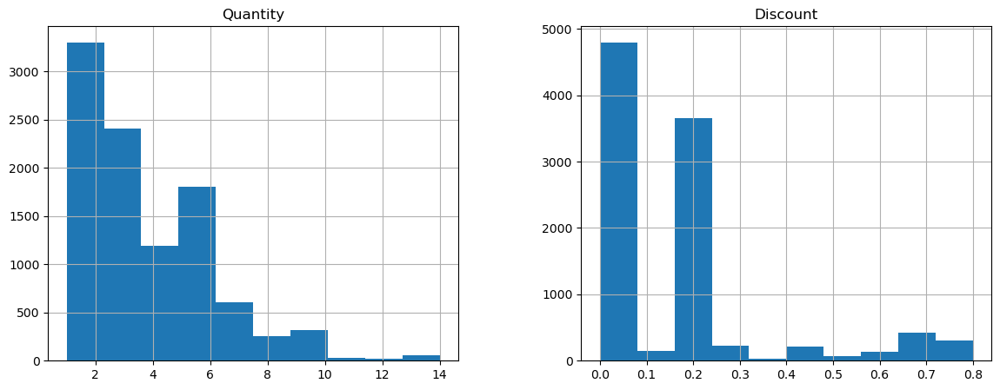

In [12]:
RawSales.hist(column = ['Quantity','Discount'],figsize = (14,5))

array([[<Axes: title={'center': 'Sales'}>,
        <Axes: title={'center': 'Profit'}>]], dtype=object)

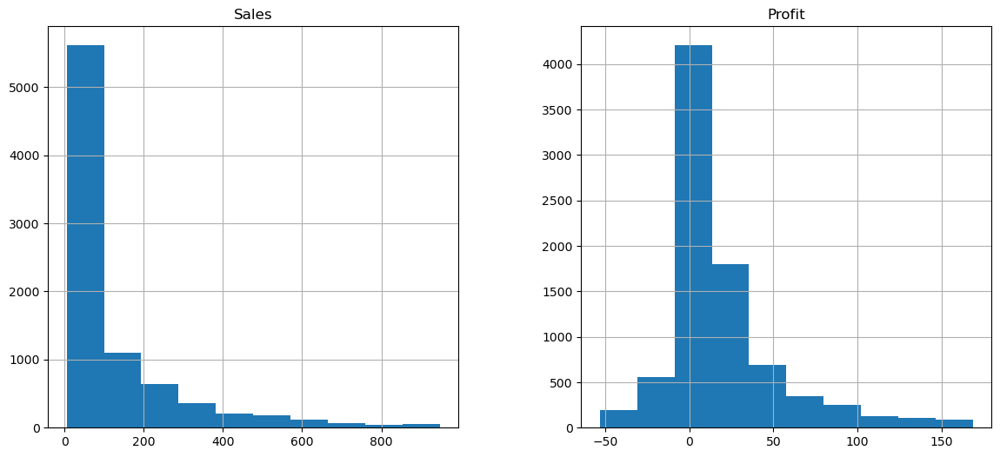

In [13]:
q_lowS = RawSales["Sales"].quantile(0.05)
q_hiS  = RawSales["Sales"].quantile(0.95)
q_lowP = RawSales["Profit"].quantile(0.05)
q_hiP  = RawSales["Profit"].quantile(0.95)

df_filtered = RawSales[(RawSales["Sales"] < q_hiS) & (RawSales["Sales"] > q_lowS)
                       &(RawSales["Profit"] < q_hiP) & (RawSales["Profit"] > q_lowP)]
df_filtered.hist(column = ['Sales','Profit'],figsize = (14,6))

In [14]:
CountSub = (pd.DataFrame(RawSales['Sub-Category'].value_counts())).reset_index()
CountCity = (pd.DataFrame(RawSales['City'].value_counts())).reset_index().head(15)
CountShipMode = (pd.DataFrame(RawSales['Ship Mode'].value_counts())).reset_index()
CountState = (pd.DataFrame(RawSales['State'].value_counts())).reset_index()

In [15]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(go.Bar(x=CountState['index'], y=CountState['State']),
              1, 1)

fig.add_trace(go.Bar(x=CountCity['index'], y=CountCity['City'],),
              1, 2)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False)
fig.show()

In [16]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

fig.add_trace(go.Bar(x=CountSub['index'], y=CountSub['Sub-Category']),
              1, 1)

fig.add_trace(go.Bar(x=CountShipMode['index'], y=CountShipMode['Ship Mode'],),
              1, 2)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False)
fig.show()

### Correlation matrix and Heat Graph
- Correlation Matrix and heat graph of numerical values
-  Notes
    - from examing the correlation between profit and other featuers besides the obviously correlation between Sales and self made features there is a strong correlation between discount wich will be investigated futher 

In [17]:
CorrMatrix = RawSales.corr()
CorrMatrix

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\612389027.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Row ID,Postal Code,Sales,Quantity,Discount,Profit,DiscountXSales,SalesAndDiscountDiff,Cost
Row ID,1.000000,0.009671,-0.001359,-0.004016,0.013480,0.012497,-0.011273,0.001859,-0.006852
Postal Code,0.009671,1.000000,-0.023854,0.012761,0.058443,-0.029961,0.006015,-0.029410,-0.014247
Sales,-0.001359,-0.023854,1.000000,0.200795,-0.028190,0.479064,0.610248,0.970510,0.927710
Quantity,-0.004016,0.012761,0.200795,1.000000,0.008623,0.066253,0.101840,0.201171,0.199012
Discount,0.013480,0.058443,-0.028190,0.008623,1.000000,-0.219487,0.176579,-0.086325,0.061448
Profit,0.012497,-0.029961,0.479064,0.066253,-0.219487,1.000000,-0.259087,0.632732,0.116757
DiscountXSales,-0.011273,0.006015,0.610248,0.101840,0.176579,-0.259087,1.000000,0.401281,0.800647
SalesAndDiscountDiff,0.001859,-0.029410,0.970510,0.201171,-0.086325,0.632732,0.401281,1.000000,0.828992
Cost,-0.006852,-0.014247,0.927710,0.199012,0.061448,0.116757,0.800647,0.828992,1.000000


### Inshights From Graph and Matrix
    -Cost has a postive Correlation with cost
    -Discount has a negtive Correlation but very little of one

<Axes: >

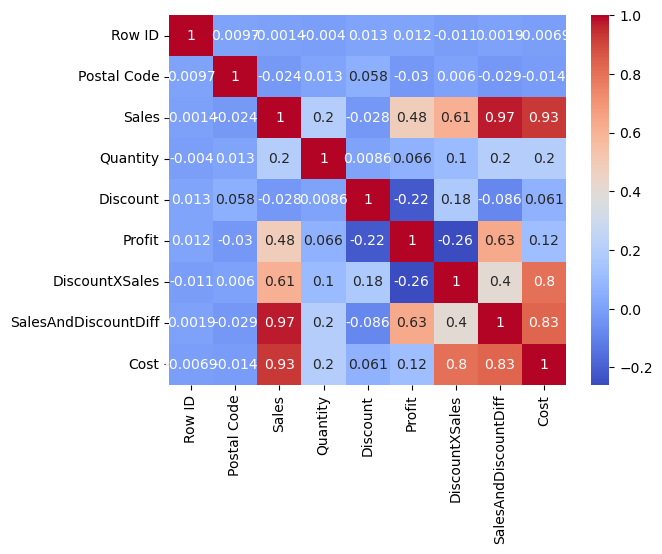

In [18]:
sns.heatmap(CorrMatrix, cmap='coolwarm', annot=True)

### Sales and Profit vs Time

In [19]:
DateSalesAndProfit = RawSales.groupby('Order Date',as_index = False).sum()
DateSalesAndProfit

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\3020269315.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Order Date,Row ID,Postal Code,Sales,Quantity,Discount,Profit,DiscountXSales,SalesAndDiscountDiff,Cost
0,2011-01-04,7981,77095,16.4480,2,0.20,5.5512,3.289600,13.158400,10.8968
1,2011-01-05,2223,181620,288.0600,8,1.20,-65.9901,59.736000,228.324000,354.0501
2,2011-01-06,1760,19143,19.5360,3,0.20,4.8840,3.907200,15.628800,14.6520
3,2011-01-07,64855,417594,4407.1000,30,0.00,1358.0524,0.000000,4407.100000,3049.0476
4,2011-01-08,15323,154680,87.1580,10,1.40,-71.9621,54.380800,32.777200,159.1201
...,...,...,...,...,...,...,...,...,...,...
1233,2014-12-27,18429,243617,814.5940,12,0.90,61.1202,5.398800,809.195200,753.4738
1234,2014-12-28,5141,86110,177.6360,6,0.60,-31.9742,68.404800,109.231200,209.6102
1235,2014-12-29,81880,1135023,1657.3508,64,4.12,253.1188,161.160896,1496.189904,1404.2320
1236,2014-12-30,65094,729564,2915.5340,41,0.40,644.4338,139.188800,2776.345200,2271.1002


<Axes: xlabel='Order Date'>

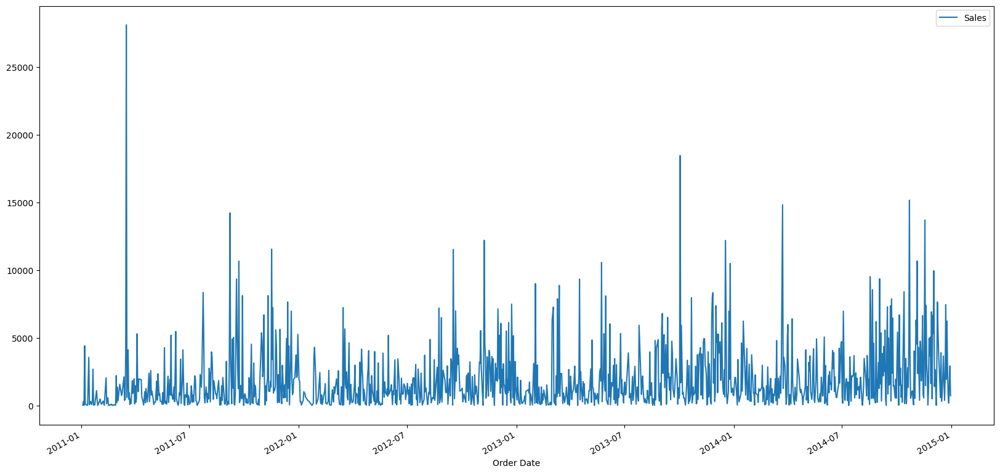

In [20]:
DateSalesAndProfit.plot(kind = 'line',x = 'Order Date',y = 'Sales',figsize = (20,10))

<Axes: xlabel='Order Date'>

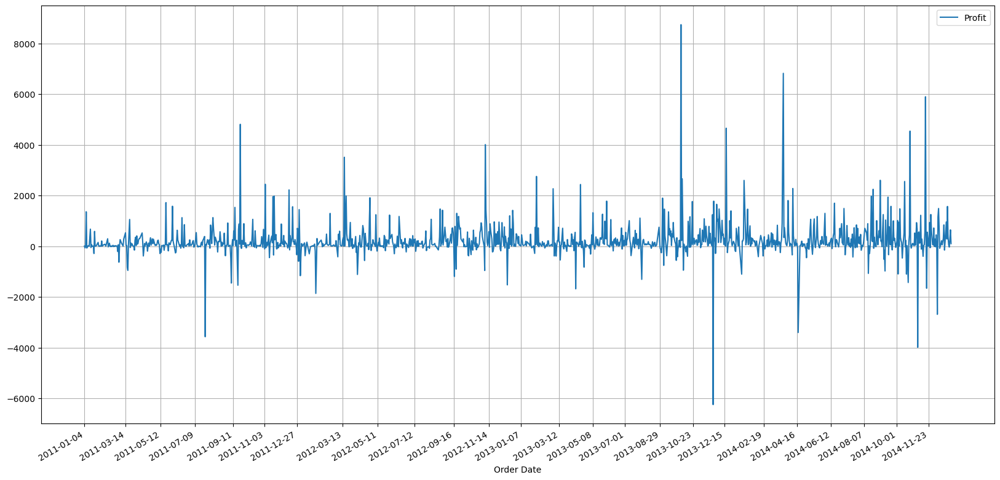

In [21]:
DateSalesAndProfit.plot(kind = 'line',x = 'Order Date',y = 'Profit',figsize = (20,10),grid = True,xticks = DateSalesAndProfit['Order Date'].values[::50])

In [22]:
DateSalesAndProfit.sort_values(by = 'Sales',ascending=False).head()

,Order Date,Row ID,Postal Code,Sales,Quantity,Discount,Profit,DiscountXSales,SalesAndDiscountDiff,Cost
54,2011-03-18,47039,594137,28106.716,48,2.35,-954.7089,12205.9227,15900.7933,29061.4249
833,2013-10-03,41646,334572,18452.972,27,0.70,8738.7971,38.3544,18414.6176,9714.1749
1170,2014-10-23,52082,558313,15158.877,49,2.20,4539.8266,2466.0669,12692.8101,10619.0504
978,2014-03-24,43483,583947,14816.068,33,0.40,6818.6276,35.6976,14780.3704,7997.4404
197,2011-09-08,90391,1862638,14228.428,112,4.30,-1452.6877,4605.9060,9622.5220,15681.1157


## 5 Days of High Sale
    - 2011-03-18	
    - 2013-10-03
    - 2014-10-23
    - 2014-03-24
    - 2011-09-08
 For most of these Dates there dose not seem to be a clear reason for such High Sales as for know. For the Dates of 2013-10-03 and 2014-10-23 Im Guessing that is due to those dates proximity to hallowen futher reseach is need to Verfity that idea though

<Axes: xlabel='Order Date'>

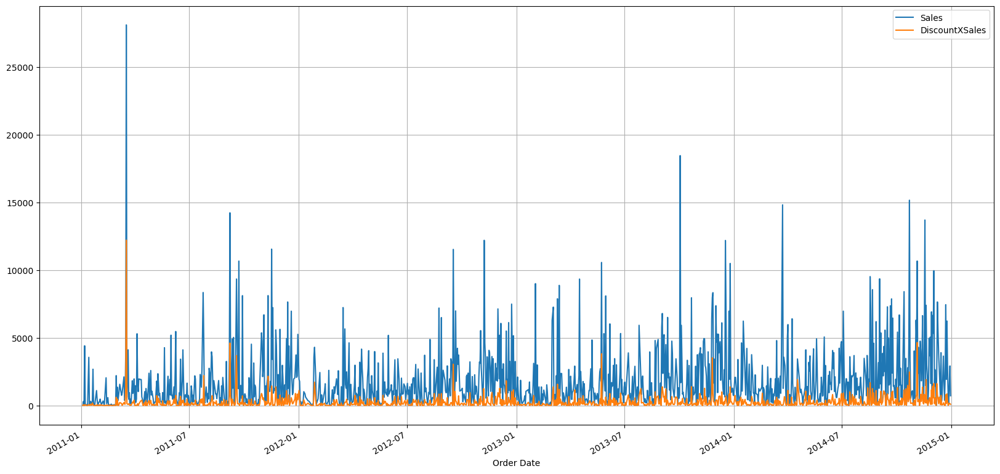

In [23]:
DateSalesAndProfit.plot(kind = 'line',x = 'Order Date',y = ['Sales','DiscountXSales'],figsize = (20,10),grid = True)

In [24]:
DatesOfHighSales = DateSalesAndProfit.sort_values(by = 'Sales',ascending=False).head(20)['Order Date'].values

In [25]:
DateSalesAndProfit.sort_values(by = 'Discount',ascending=False).head(20)['Order Date'].values

array(['2013-09-06T00:00:00.000000000', '2014-12-03T00:00:00.000000000',
       '2011-11-18T00:00:00.000000000', '2014-09-10T00:00:00.000000000',
       '2014-10-03T00:00:00.000000000', '2012-11-20T00:00:00.000000000',
       '2014-09-05T00:00:00.000000000', '2014-11-05T00:00:00.000000000',
       '2014-11-13T00:00:00.000000000', '2014-11-20T00:00:00.000000000',
       '2012-11-21T00:00:00.000000000', '2014-12-26T00:00:00.000000000',
       '2013-03-14T00:00:00.000000000', '2013-09-03T00:00:00.000000000',
       '2011-11-11T00:00:00.000000000', '2012-09-17T00:00:00.000000000',
       '2012-09-26T00:00:00.000000000', '2011-09-07T00:00:00.000000000',
       '2014-12-02T00:00:00.000000000', '2014-07-22T00:00:00.000000000'],
      dtype='datetime64[ns]')

#### Sinces it quite hard to read the sales graphs with so much data im breaking it up into 4ths

In [26]:
onefour = int(len(DateSalesAndProfit)/4)
twofour = int(onefour * 2)
threefour = int(twofour + len(DateSalesAndProfit)/4)
fourfour = int(twofour * 2)

<Axes: xlabel='Order Date'>

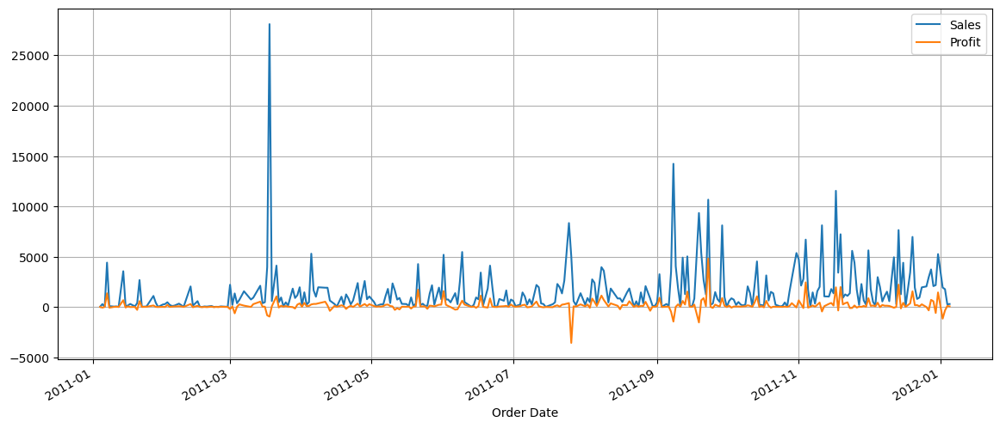

In [27]:
DateSalesAndProfit.iloc[:onefour].plot(kind = 'line',x = 'Order Date',y = ['Sales','Profit'],figsize = (14,6),grid = True)

<Axes: xlabel='Order Date'>

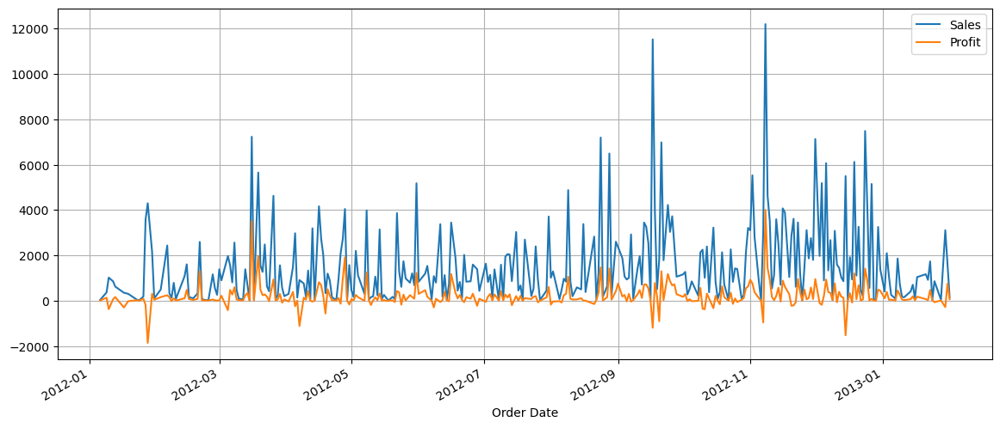

In [28]:
DateSalesAndProfit.iloc[onefour:twofour].plot(kind = 'line',x = 'Order Date',y = ['Sales','Profit'],figsize = (14,6),grid = True)

<Axes: xlabel='Order Date'>

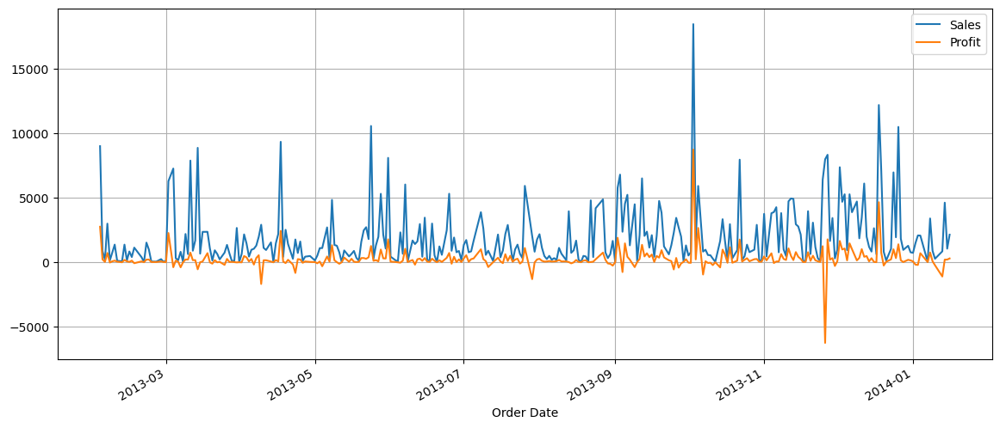

In [29]:
DateSalesAndProfit.iloc[twofour:threefour].plot(kind = 'line',x = 'Order Date',y = ['Sales','Profit'],figsize = (14,6),grid = True)

<Axes: xlabel='Order Date'>

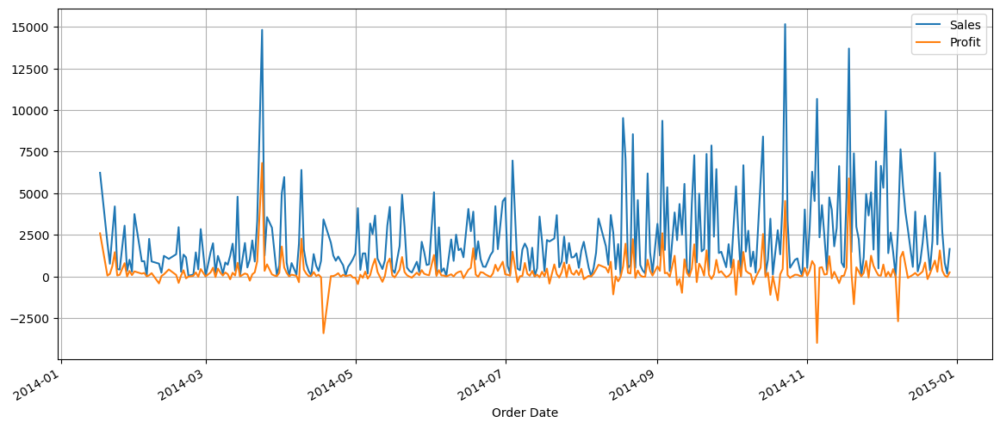

In [30]:
DateSalesAndProfit.iloc[threefour:fourfour].plot(kind = 'line',x = 'Order Date',y = ['Sales','Profit'],figsize = (14,6),grid = True)

### Notes about Sales and Profit vs Time
 - An interesting note about the sales and profit versus time graphs is that certain apexes of sales correlated with an apex of negative profit. I am curious about why at certain apexes of high sales, there is an apex of high profit in the positive region, but in other sections where there are high sales, there is a negative profit. This is either a clearance sale with a high discount or an unprofitable product. 

In [31]:
NoProfit = RawSales[RawSales['Profit']==0]
NegProfit = RawSales[RawSales['Profit']<0]
PosProfit = RawSales[RawSales['Profit']>0]
NegProfit['Profit'] = NegProfit['Profit']*-1


C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\2869720953.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
NegProfit.to_csv('NegativeProfit.csv')
PosProfit.to_csv('PostiveProfit.csv')

In [33]:
NegProfit['Sub-Category'].unique()

array(['Tables', 'Appliances', 'Binders', 'Chairs', 'Bookcases',
       'Furnishings', 'Storage', 'Accessories', 'Phones', 'Machines',
       'Supplies', 'Fasteners'], dtype=object)

In [34]:
PosProfit['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Storage', 'Furnishings', 'Art',
       'Phones', 'Binders', 'Appliances', 'Tables', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [35]:
ByState = NegProfit.groupby('State').sum().sort_values('Profit' , ascending = False)
ListOfStates = NegProfit.groupby('State').sum().sort_values('Profit' , ascending = False).index.values[0:5]

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\1932626060.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\1932626060.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [36]:
fig = px.pie(ByState[0:5], values='Profit', 
            names= ListOfStates, 
            title='Pie Chart of Postive Profit State')
fig.show()

### Histogram of Neg and Pos Profit
- For visualization purposes, I eliminated the 95% tile of data points in the negative and positive profit data sets In the Box graph visualization.


array([[<Axes: title={'center': 'Quantity'}>]], dtype=object)

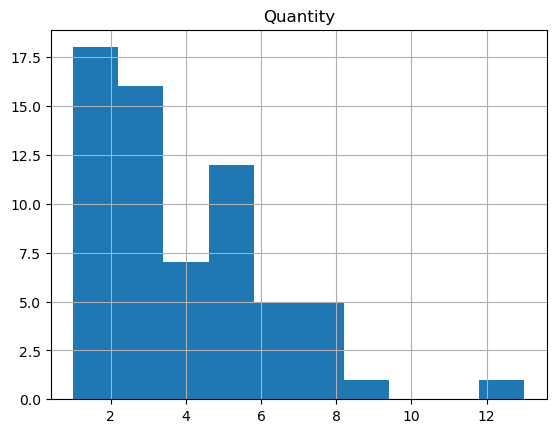

In [37]:
NoProfit.hist(column = ['Quantity'])

array([[<Axes: title={'center': 'Quantity'}>]], dtype=object)

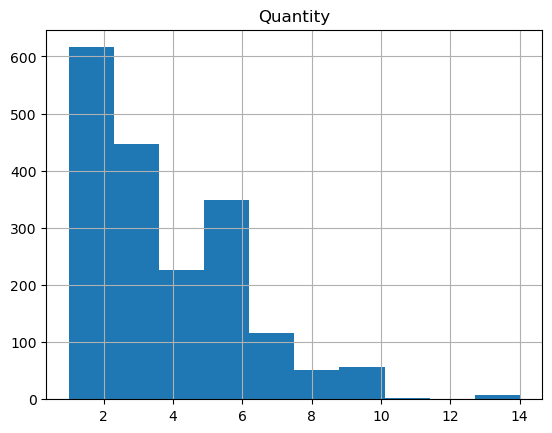

In [38]:
NegProfit.hist(column = ['Quantity'])

array([[<Axes: title={'center': 'Quantity'}>]], dtype=object)

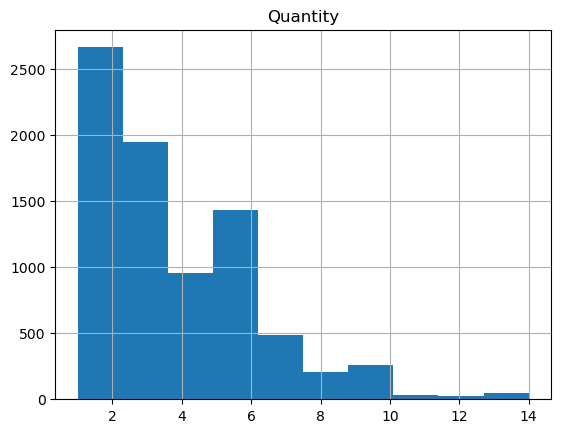

In [39]:
PosProfit.hist(column = ['Quantity'])

array([[<Axes: title={'center': 'Discount'}>]], dtype=object)

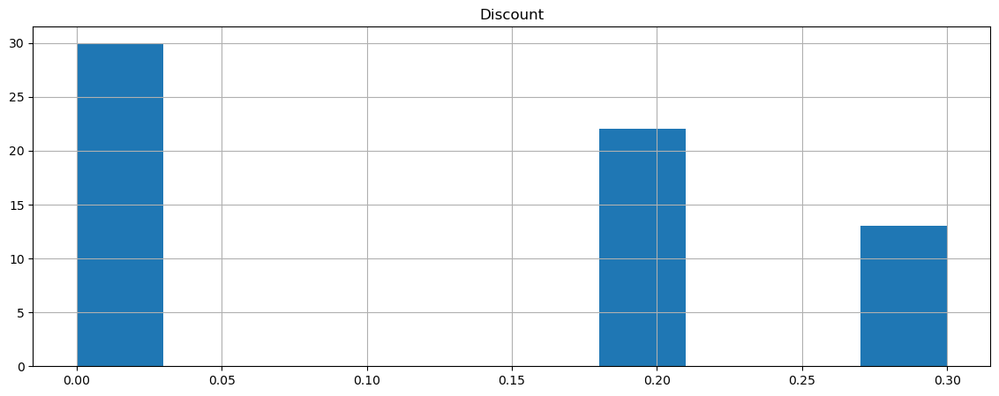

In [40]:
NoProfit.hist(column = 'Discount', figsize =(14,5))

array([[<Axes: title={'center': 'Discount'}>]], dtype=object)

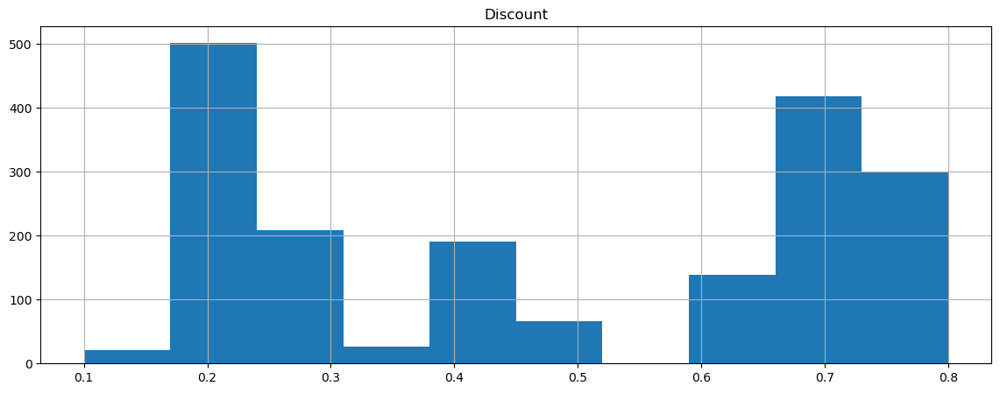

In [41]:
NegProfit.hist(column = 'Discount', figsize =(14,5))

array([[<Axes: title={'center': 'Discount'}>]], dtype=object)

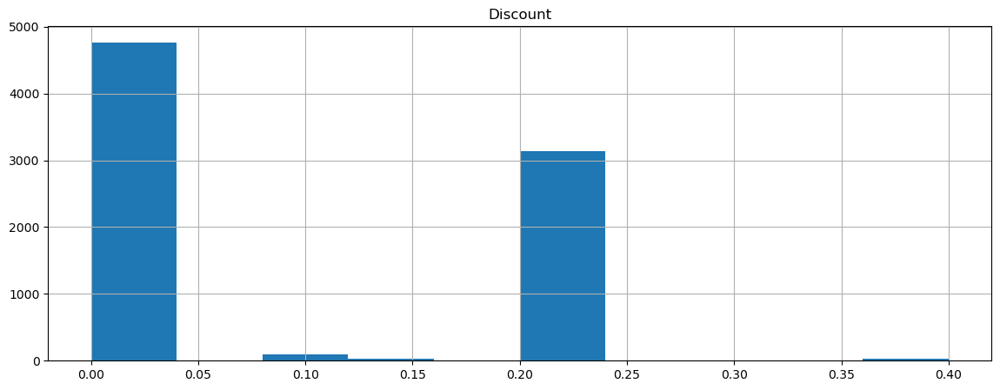

In [42]:
PosProfit.hist(column = 'Discount', figsize =(14,5))

In [43]:
q_hiN  = NegProfit["Sales"].quantile(0.95)
q_hiP  = PosProfit["Sales"].quantile(0.95)
df_NegS = NegProfit[(NegProfit["Sales"] < q_hiN)]
df_PosS = PosProfit[(PosProfit["Sales"] < q_hiP)]

<Axes: >

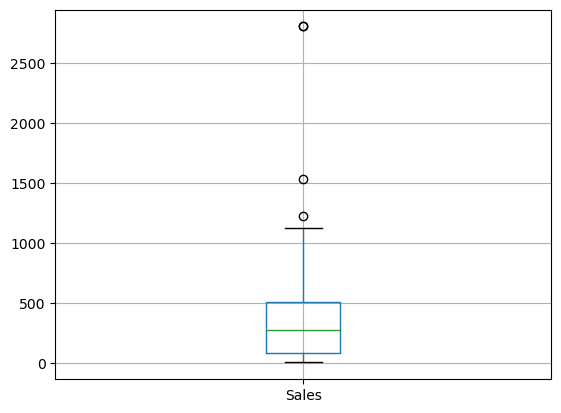

In [44]:
NoProfit.boxplot(column = 'Sales')

<Axes: >

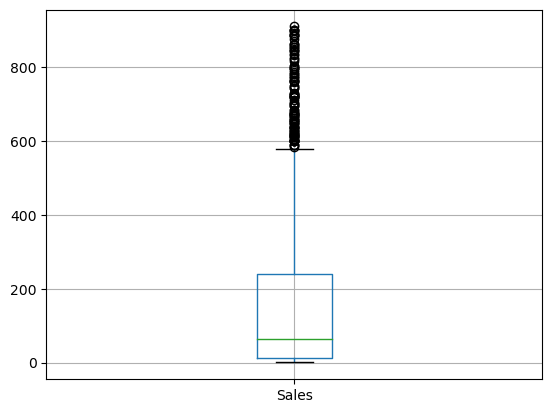

In [45]:
df_NegS.boxplot(column = 'Sales')

<Axes: >

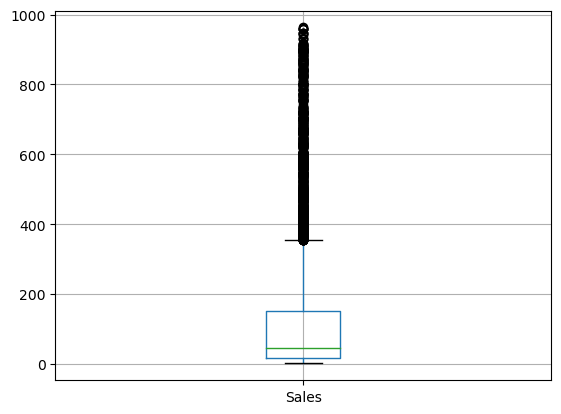

In [46]:
df_PosS.boxplot(column = 'Sales')

### Observations from the histogram of negative and positive profits
-  Discounts had higher values in the Negative profit data set than in the positive profit set. Of course, this suggests that the reason for such high sales and low profits was due to some clearance sales, as many discounts were in the 60-80% region.

In [47]:

fig = px.sunburst(NoProfit, path=['Category', 'Sub-Category'], values='Sales')
fig.update_traces(textinfo="label+percent parent")
fig.show()

In [48]:
fig = px.sunburst(NegProfit, path=['Category', 'Sub-Category'], values='Profit',)
fig.update_traces(textinfo="label+percent parent")
fig.show()

In [49]:
fig = px.sunburst(PosProfit, path=['Category', 'Sub-Category'], values='Profit')
fig.update_traces(textinfo="label+percent parent")
fig.show()

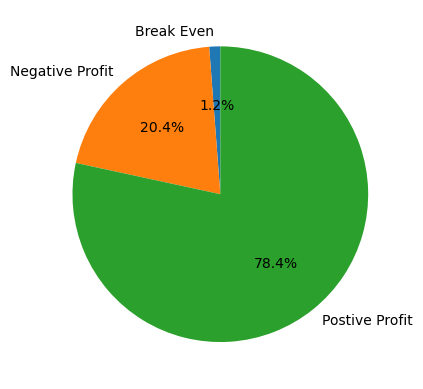

<Figure size 1400x600 with 0 Axes>

In [50]:
VolumeOfNo = NoProfit['Sales'].sum()
VolumeOfN = NegProfit['Sales'].sum()
VolumeOfP = PosProfit['Sales'].sum()
plt.pie([VolumeOfNo,VolumeOfN,VolumeOfP], labels = ['Break Even','Negative Profit','Postive Profit'], startangle = 90,autopct='%1.1f%%')
plt.figure(figsize=(14,6))
plt.show() 

## Note there About Category Profit
- Office Supllies appears in the same volume in both Negtive and Postive Profit about 38% of the pie
     - Binders appears are the largest volume in office Supplies in negtive profit however there is still a          substantial volume in office Supplies for postive profit
- Furniture, however, seems unprofitable due to its high Negative profit 39% volume but low positive profit volume 18%.
    - High amount in negative Profit and low amount in postive profit: Tabels(53%-0%)
    - low amount in negative Profit and low amount in postive profit: Charis(46%-0), Furnishings(25% - 0%),Tables(19% - 0%),
- Technology holds a significant volume in the positive data set while holding a small amount in the negative profit data set.
    - High amount in negative Profit and low amount in postive profit: Machines(78% - 18%)
    - low amount in negative Profit and low amount in postive profit: Copiers,Phones
    - about even: Phones(28-20)%
- The NoProfit data set Volume could not be measured by profit due to the lack of it, so instead, I use quantity as the measure of relative volume.
    - Furniture and office supplies hold the majority in the no-profit data set regarding volume of quantity. Among those categories, the most popular subcategories in volume in terms of quantity are Storage chairs and Furnishings.
    
  

### Examing Quantity for each Sub Catgory
- In the below section, I'm Visualizing both negative and positive profit sets using bar graphs to compare the amount of elements or quantity sold of each sub-category 

<Axes: xlabel='Sub-Category'>

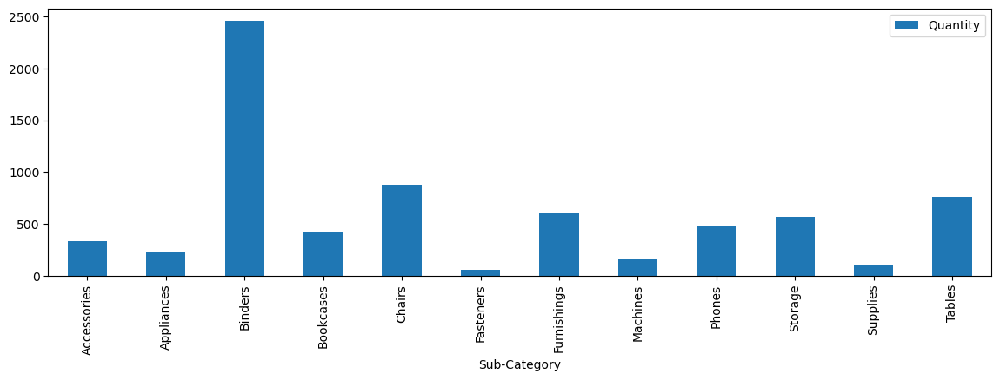

In [51]:
NegProfit.groupby('Sub-Category',as_index = False).sum('Quantity').plot(kind = 'bar',x = 'Sub-Category',y='Quantity',figsize=(14, 4))

<Axes: xlabel='Sub-Category'>

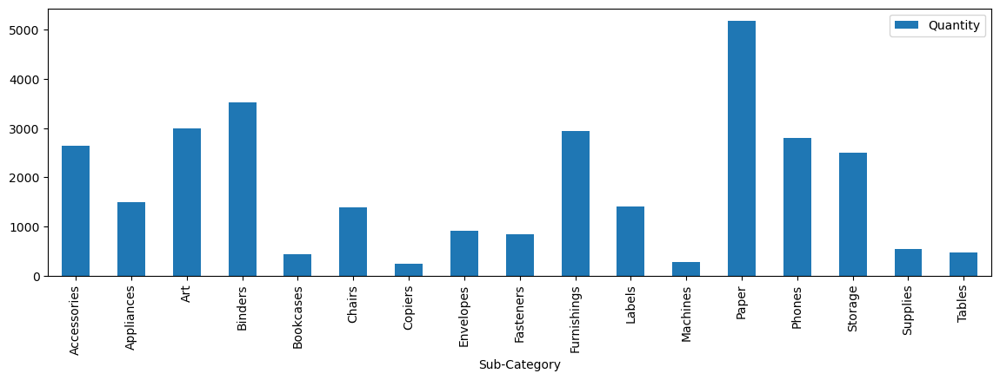

In [52]:
PosProfit.groupby('Sub-Category',as_index = False).sum('Quantity').plot(kind = 'bar',x = 'Sub-Category',y='Quantity',figsize=(14, 4))

### Examing Location and Profit RelationShip

In [53]:
fig = px.sunburst(NegProfit, path=['Region','State', 'City'], values='Sales')
fig.update_traces(textinfo="label+percent parent")
fig.show()

In [54]:
fig = px.sunburst(PosProfit, path=['Region','State', 'City'], values='Sales')
fig.update_traces(textinfo="label+percent parent")
fig.show()

### Visualizing amount of Discount in the Negative and Postive Profit Data Sets and the Relsonship Between Discount and Sub-Category

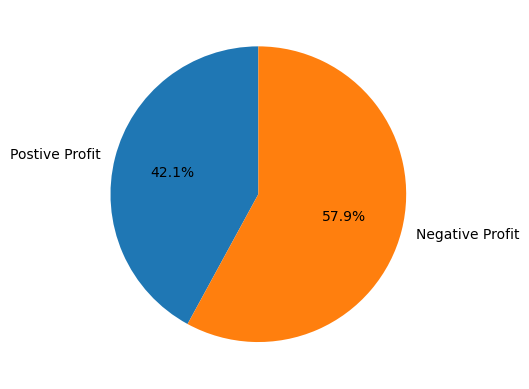

In [55]:
PosDiscountSum = PosProfit['Discount'].sum()
NegDiscountSum = NegProfit['Discount'].sum()
plt.pie([PosDiscountSum,NegDiscountSum], labels = ['Postive Profit','Negative Profit'], startangle = 90,autopct='%1.1f%%')
plt.show()

In [56]:
PosCatgoryDis = PosProfit.groupby('Sub-Category',as_index = False)[['Discount']].mean()
NegCatgoryDis = NegProfit.groupby('Sub-Category',as_index = False)[['Discount']].mean()

<Axes: title={'center': 'Sub-Category vs Sum Of Discount'}, xlabel='Sub-Category', ylabel='Discount Total'>

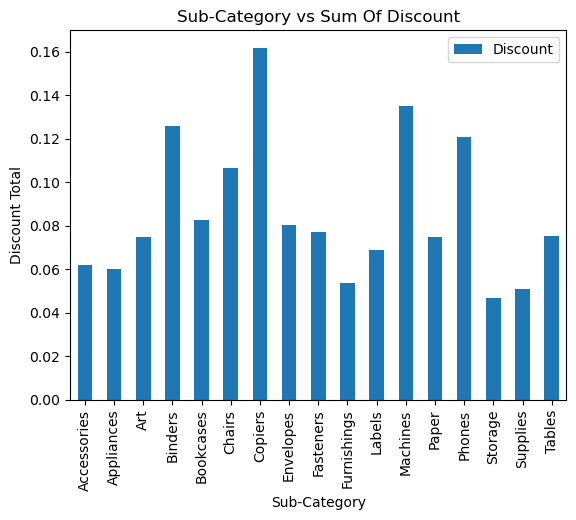

In [57]:
PosCatgoryDis.plot(kind = 'bar', x = 'Sub-Category',y = 'Discount',title = 'Sub-Category vs Sum Of Discount', ylabel = 'Discount Total')

<Axes: title={'center': 'Sub-Category vs Sum Of Discount'}, xlabel='Sub-Category', ylabel='Discount Total'>

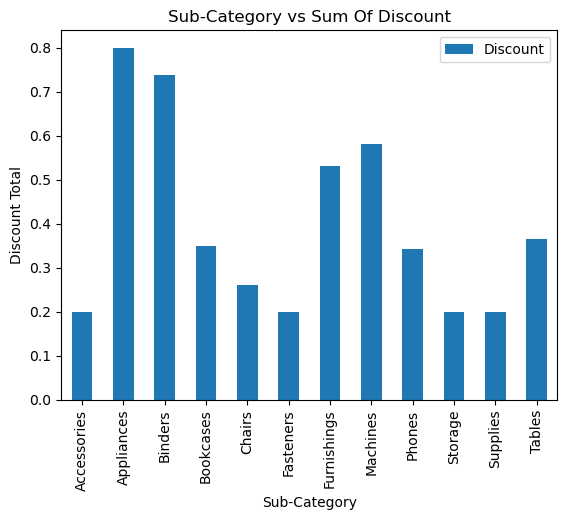

In [58]:
NegCatgoryDis.plot(kind = 'bar', x = 'Sub-Category',y = 'Discount',title = 'Sub-Category vs Sum Of Discount', ylabel = 'Discount Total')

<BarContainer object of 2 artists>

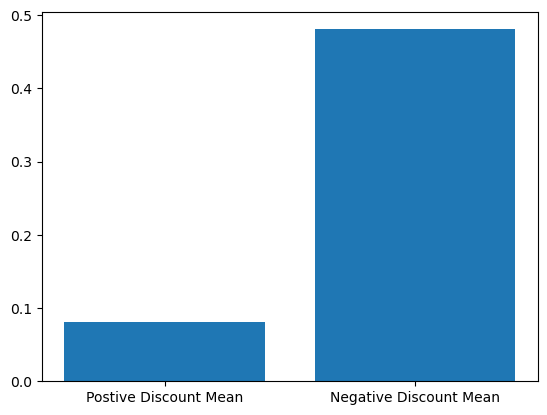

In [59]:
DiscountMeanPos = PosProfit['Discount'].mean()
DiscountMeanNeg = NegProfit['Discount'].mean()
plt.bar(x = ['Postive Discount Mean','Negative Discount Mean'], height = [DiscountMeanPos,DiscountMeanNeg])

In [60]:
fig = px.scatter(NegProfit, x='Discount', y="Profit", color="Category")
fig.show()

In [61]:
fig = px.scatter(PosProfit, x='Discount', y="Profit", color="Category")
fig.show()

In [62]:
RawSales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Row ID                9994 non-null   int64         
 1   Order ID              9994 non-null   object        
 2   Order Date            9994 non-null   datetime64[ns]
 3   Ship Date             9994 non-null   object        
 4   Ship Mode             9994 non-null   object        
 5   Customer ID           9994 non-null   object        
 6   Customer Name         9994 non-null   object        
 7   Segment               9994 non-null   object        
 8   Country               9994 non-null   object        
 9   City                  9994 non-null   object        
 10  State                 9994 non-null   object        
 11  Postal Code           9994 non-null   int64         
 12  Region                9994 non-null   object        
 13  Product ID        

### Exmaing if there is any realtionship between Category, Sub-Category, State, Region or City and Sales and Profit using Bar Graphs 

In [63]:
SumOfCat = RawSales.groupby('Category',as_index = False)[['Sales','Profit','Discount']].sum()
SumofSubCat = RawSales.groupby('Sub-Category',as_index = False)[['Sales','Profit']].sum()
SumofState = RawSales.groupby('State',as_index = False)[['Sales','Profit']].sum()
SumofRegion = RawSales.groupby('Region',as_index = False)[['Sales','Profit']].sum()
SumofRow = RawSales.groupby('Row ID',as_index = False)[['Sales','Profit']].sum()

In [64]:
fig = px.sunburst(RawSales, path=['Category', 'Sub-Category'], values='Sales')
fig.update_traces(textinfo="label+percent parent")
fig.show()

In [65]:
fig = px.sunburst(RawSales, path=['Region','State', 'City'], values='Sales')
fig.update_traces(textinfo="label+percent parent")
fig.show()

<Axes: xlabel='Sub-Category', ylabel='$ Value'>

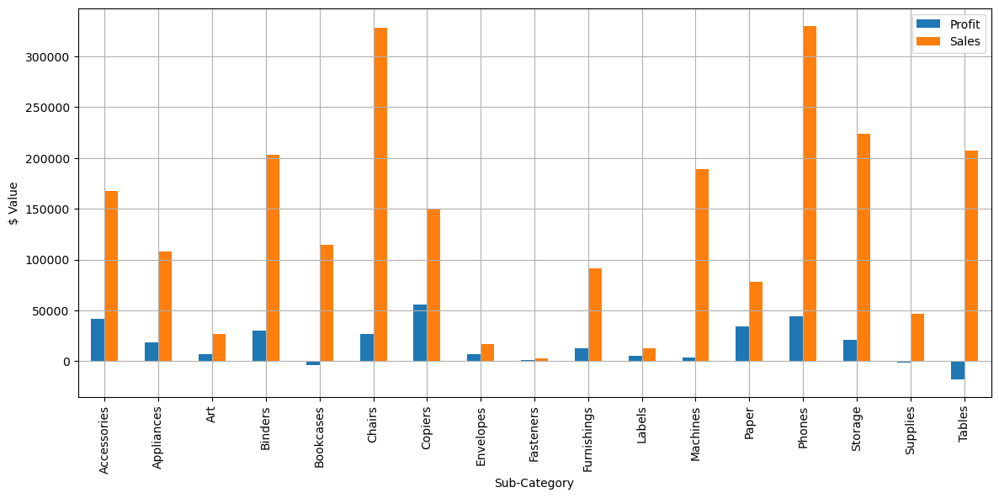

In [66]:
SumofSubCat.plot(kind = 'bar', x = 'Sub-Category',y = ['Profit','Sales'],grid = True,ylabel = '$ Value',figsize = (14,6))

<Axes: xlabel='State', ylabel='$ Value'>

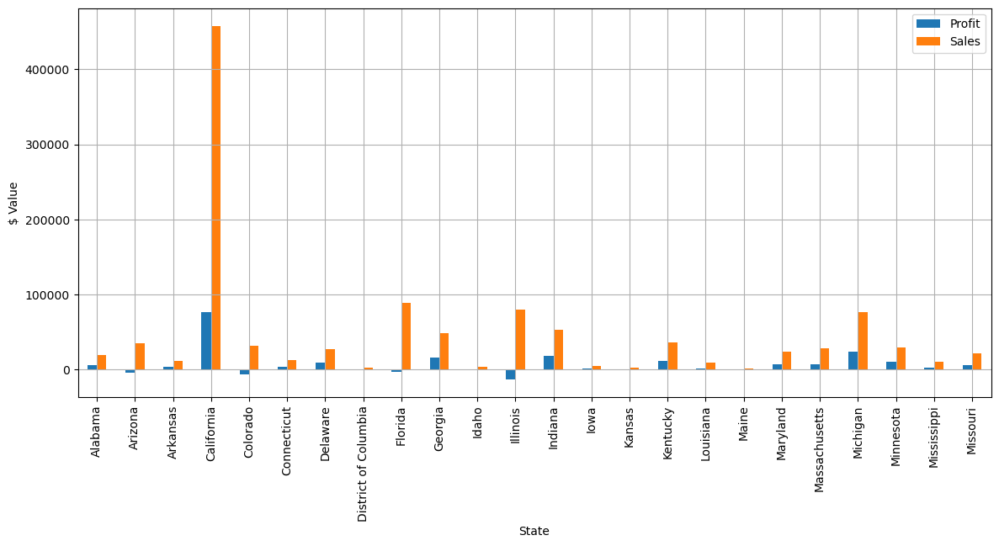

In [67]:
SumofState.iloc[:int(len(SumofState['State'])/2)].plot(kind = 'bar', x = 'State',y = ['Profit','Sales'],grid = True,ylabel = '$ Value',figsize = (14,6))

<Axes: xlabel='State', ylabel='$ Value'>

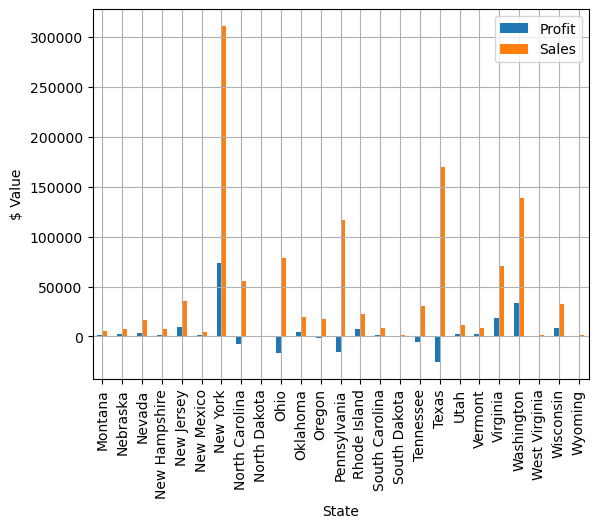

In [68]:
SumofState.iloc[int(len(SumofState['State'])/2):].plot(kind = 'bar', x = 'State',y = ['Profit','Sales'],grid = True,ylabel = '$ Value')

<Axes: xlabel='Region', ylabel='$ Value'>

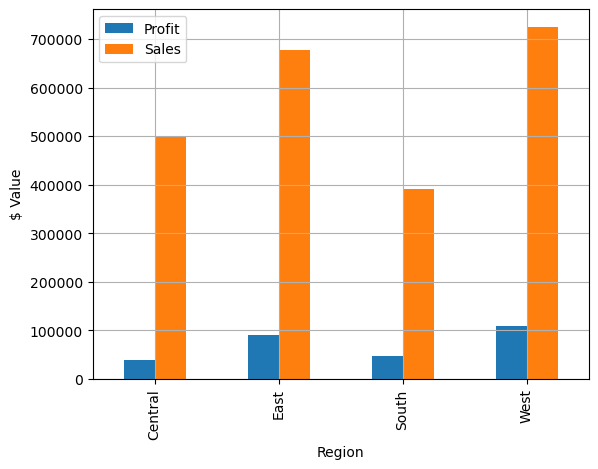

In [69]:
SumofRegion.plot(kind = 'bar', x = 'Region',y = ['Profit','Sales'],grid = True,ylabel = '$ Value')

### Creating a visual Map of Sales using Folium
- I am using folium to visualize the profit per state to give some geographical visuals on profit.

In [70]:
state_geo = 'us-states (1).json'

In [71]:
mapofUSA = folium.Map(location = [48,-102], zoom_start = 3)
folium.Choropleth(geo_data = state_geo, data = SumofState,
                 columns = ['State','Profit'],
                 key_on = 'properties.name',
                 fill_color = 'BuPu',fill_opacity = 0.7,line_opacity = 0.1,
                 legend_name = 'Total Hate Crimes Per Population').add_to(mapofUSA)

In [72]:
mapofUSA

In [73]:
RawSales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Row ID                9994 non-null   int64         
 1   Order ID              9994 non-null   object        
 2   Order Date            9994 non-null   datetime64[ns]
 3   Ship Date             9994 non-null   object        
 4   Ship Mode             9994 non-null   object        
 5   Customer ID           9994 non-null   object        
 6   Customer Name         9994 non-null   object        
 7   Segment               9994 non-null   object        
 8   Country               9994 non-null   object        
 9   City                  9994 non-null   object        
 10  State                 9994 non-null   object        
 11  Postal Code           9994 non-null   int64         
 12  Region                9994 non-null   object        
 13  Product ID        

In [74]:
SQLData = RawSales.rename(columns = {'Order Date':'OrderDate','Sub-Category':'SubCatgory','Row ID':'RowID','Order ID':'OrderID','Ship Date':'ShipDate',
                                    'Ship Mode':'ShipMode','Customer ID':'CustomerID','Customer Name':'CustomerName',
                                    'Postal Code': 'PostalCode','Product ID' : 'ProductID','Product Name': 'Product Name'})


### SQL Lite Demonstration
- In this section, I will demonstrate my ability to search queries using SQL and therefore using SQL Lite and the ability to load data into an SQL light Database. 

In [75]:
%load_ext sql

In [76]:
con = sqlite3.connect("Sales_data1.db")
cur = con.cursor()

In [77]:
%sql sqlite:///Sales_data1.db

In [78]:
SQLData.to_sql("SALESDATA", con, if_exists='replace', index=False,method="multi")

9994

In [79]:
%sql create table SALESDATA as select * from SALESDATA where Date is not null

 * sqlite:///Sales_data1.db
(sqlite3.OperationalError) table SALESDATA already exists
[SQL: create table SALESDATA as select * from SALESDATA where Date is not null]
(Background on this error at: https://sqlalche.me/e/20/e3q8)


In [80]:
%sql PRAGMA table_info(SALESDATA)

 * sqlite:///Sales_data1.db
Done.


cid,name,type,notnull,dflt_value,pk
0,RowID,INTEGER,0,None,0
1,OrderID,TEXT,0,None,0
2,OrderDate,TIMESTAMP,0,None,0
3,ShipDate,TEXT,0,None,0
4,ShipMode,TEXT,0,None,0
5,CustomerID,TEXT,0,None,0
6,CustomerName,TEXT,0,None,0
7,Segment,TEXT,0,None,0
8,Country,TEXT,0,None,0
9,City,TEXT,0,None,0


In [81]:
%sql select * from SALESDATA

 * sqlite:///Sales_data1.db
Done.


RowID,OrderID,OrderDate,ShipDate,ShipMode,CustomerID,CustomerName,Segment,Country,City,State,PostalCode,Region,ProductID,Category,SubCatgory,Product Name,Sales,Quantity,Discount,Profit,DiscountXSales,SalesAndDiscountDiff,Cost,ProfitLabel
1,CA-2013-152156,2013-11-09 00:00:00,12-11-2013,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.96,2,0.0,41.9136,0.0,261.96,220.04639999999998,Profit
2,CA-2013-152156,2013-11-09 00:00:00,12-11-2013,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back",731.94,3,0.0,219.582,0.0,731.94,512.3580000000001,Profit
3,CA-2013-138688,2013-06-13 00:00:00,17-06-2013,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters by Universal,14.62,2,0.0,6.8714,0.0,14.62,7.748599999999999,Profit
4,US-2012-108966,2012-10-11 00:00:00,18-10-2012,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.031,430.909875,526.667625,1340.6085,No-Profit
5,US-2012-108966,2012-10-11 00:00:00,18-10-2012,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.368,2,0.2,2.5164,4.4736,17.894399999999997,19.851599999999998,Profit
6,CA-2011-115812,2011-06-09 00:00:00,14-06-2011,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,FUR-FU-10001487,Furniture,Furnishings,"Eldon Expressions Wood and Plastic Desk Accessories, Cherry Wood",48.86,7,0.0,14.1694,0.0,48.86,34.6906,Profit
7,CA-2011-115812,2011-06-09 00:00:00,14-06-2011,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.28,4,0.0,1.9656,0.0,7.28,5.3144,Profit
8,CA-2011-115812,2011-06-09 00:00:00,14-06-2011,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.152,6,0.2,90.7152,181.43040000000002,725.7216000000001,816.4368000000001,Profit
9,CA-2011-115812,2011-06-09 00:00:00,14-06-2011,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by Samsill,18.504,3,0.2,5.7825,3.7008000000000005,14.8032,12.721500000000002,Profit
10,CA-2011-115812,2011-06-09 00:00:00,14-06-2011,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9,5,0.0,34.47,0.0,114.9,80.43,Profit


In [82]:
%sql select distinct SubCatgory from SALESDATA

 * sqlite:///Sales_data1.db
Done.


SubCatgory
Bookcases
Chairs
Labels
Tables
Storage
Furnishings
Art
Phones
Binders
Appliances


In [83]:
%sql select distinct ShipMode from SALESDATA

 * sqlite:///Sales_data1.db
Done.


ShipMode
Second Class
Standard Class
First Class
Same Day


In [84]:
%sql select * from SALESDATA where SubCatgory like 'Envelopes%' limit 5

 * sqlite:///Sales_data1.db
Done.


RowID,OrderID,OrderDate,ShipDate,ShipMode,CustomerID,CustomerName,Segment,Country,City,State,PostalCode,Region,ProductID,Category,SubCatgory,Product Name,Sales,Quantity,Discount,Profit,DiscountXSales,SalesAndDiscountDiff,Cost,ProfitLabel
31,US-2012-150630,2012-09-17 00:00:00,21-09-2012,Standard Class,TB-21520,Tracy Blumstein,Consumer,United States,Philadelphia,Pennsylvania,19140,East,OFF-EN-10001509,Office Supplies,Envelopes,Poly String Tie Envelopes,3.264,2,0.2,1.1016,0.6528,2.6111999999999997,2.1624,Profit
38,CA-2012-117415,2012-12-27 00:00:00,31-12-2012,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Houston,Texas,77041,Central,OFF-EN-10002986,Office Supplies,Envelopes,"#10-4 1/8"" x 9 1/2"" Premium Diagonal Seam Envelopes",113.328,9,0.2,35.415,22.6656,90.6624,77.91300000000001,Profit
84,CA-2012-149734,2012-09-03 00:00:00,08-09-2012,Standard Class,JC-16105,Julie Creighton,Corporate,United States,Durham,North Carolina,27707,South,OFF-EN-10000927,Office Supplies,Envelopes,Jet-Pak Recycled Peel 'N' Seal Padded Mailers,200.984,7,0.2,62.8075,40.1968,160.7872,138.1765,Profit
115,CA-2011-115259,2011-08-25 00:00:00,27-08-2011,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,Ohio,43229,East,OFF-EN-10002600,Office Supplies,Envelopes,"Redi-Strip #10 Envelopes, 4 1/8 x 9 1/2",4.72,2,0.2,1.652,0.944,3.776,3.0679999999999996,Profit
117,CA-2011-115259,2011-08-25 00:00:00,27-08-2011,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,Ohio,43229,East,OFF-EN-10002504,Office Supplies,Envelopes,"Tyvek Top-Opening Peel & Seel Envelopes, Plain White",130.464,6,0.2,44.0316,26.0928,104.3712,86.4324,Profit


In [85]:
%sql Select SUM(DiscountXSales) as Sum_Of_DiscountXSales from SALESDATA where SubCatgory Like '%Accessories%'

 * sqlite:///Sales_data1.db
Done.


Sum_Of_DiscountXSales
9802.0016


In [86]:
%sql Select AVG(Profit) from SALESDATA where ShipMode Like '%Standard Cla%'

 * sqlite:///Sales_data1.db
Done.


AVG(Profit)
27.494770023458393


In [87]:
%sql Select AVG(Profit) from SALESDATA where ShipMode Like '%First Class%'

 * sqlite:///Sales_data1.db
Done.


AVG(Profit)
31.839947919375827


In [88]:
%sql Select min(OrderDate) from SALESDATA where ProfitLabel Like '%No%'

 * sqlite:///Sales_data1.db
Done.


min(OrderDate)
2011-01-05 00:00:00


In [89]:
%sql Select min(OrderDate) from SALESDATA where ProfitLabel Like 'Profit'

 * sqlite:///Sales_data1.db
Done.


min(OrderDate)
2011-01-04 00:00:00


In [90]:
%sql Select SubCatgory from SALESDATA where (ProfitLabel is 'Profit') & (Sales < 20000) & (Sales > 15000)

 * sqlite:///Sales_data1.db
Done.


SubCatgory
Copiers


In [91]:
%sql Select ProfitLabel,Count(ProfitLabel) as 'Number of Values' from SALESDATA Group by ProfitLabel

 * sqlite:///Sales_data1.db
Done.


ProfitLabel,Number of Values
No-Profit,1936
Profit,8058


In [92]:
%sql Select substr(OrderDate,6,2) as Month,SubCatgory,ProfitLabel from SALESDATA where (substr(OrderDate,1,4) is '2014')

 * sqlite:///Sales_data1.db
Done.


Month,SubCatgory,ProfitLabel
04,Paper,Profit
07,Chairs,No-Profit
10,Paper,Profit
09,Phones,Profit
09,Storage,Profit
09,Paper,Profit
12,Binders,No-Profit
12,Furnishings,No-Profit
12,Storage,Profit
11,Storage,No-Profit


In [93]:
%sql Select distinct substr(OrderDate,1,4) from SALESDATA

 * sqlite:///Sales_data1.db
Done.


"substr(OrderDate,1,4)"
2013
2012
2011
2014


Rank the count of Profit Labels (such as No-Profit or Profit) between the date 2011 and 2013, in descending order.

In [94]:
%%sql select ProfitLabel, Count(ProfitLabel) as 'ProfitLabel Count' from SALESDATA where 
(substr(OrderDate,1,4) like '%2011%') or (substr(OrderDate,1,4) like '%2012%') or (substr(OrderDate,1,4) like '%2013%')
group by ProfitLabel order by Count(ProfitLabel) DESC

 * sqlite:///Sales_data1.db
Done.


ProfitLabel,ProfitLabel Count
Profit,5379
No-Profit,1296


In [95]:
%sql Select substr(OrderDate,1,4) from SALESDATA

 * sqlite:///Sales_data1.db
Done.


"substr(OrderDate,1,4)"
2013
2013
2013
2012
2012
2011
2011
2011
2011
2011


## Machine Learing Models
- Classifiction Model
    - In the Classifiction machine learning section, I want to give a model that relies on Features over which the manager or whoever is in charge of putting these items out for sale has control. I don't know if the superstore is an online site or a personal store. With that in mind, I decided to go with the idea that it is an in-person store and create a model that helps predict whether or not an individual will receive profit for putting an item of a particular subcategory with a specific discount in a  Region, State, and city. 


### Data Prep for Classification

In [96]:
ModelDataClass = RawSales[['State','Region','City','Sub-Category','ProfitLabel']]

In [97]:
le = LabelEncoder()
ModelDataClass.loc[:,'State'] = le.fit_transform(ModelDataClass.loc[:,'State'])
ModelDataClass.loc[:,'Region'] = le.fit_transform(ModelDataClass.loc[:,'Region'])
ModelDataClass.loc[:,'City'] = le.fit_transform(ModelDataClass.loc[:,'City'])
ModelDataClass.loc[:,'Sub-Category'] = le.fit_transform(ModelDataClass.loc[:,'Sub-Category'])
ModelDataClass.loc[:,'ProfitLabel'] = le.fit_transform(ModelDataClass.loc[:,'ProfitLabel'])

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\2516928375.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\2516928375.py:2: DeprecationWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`

C:\Users\Admin\AppData\Local\Temp\ipykernel_14960\2516928375.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

In [98]:
X = ModelDataClass[['State','Region','City','Sub-Category']].to_numpy()
Y = ModelDataClass[['ProfitLabel']].to_numpy()

In [99]:
transform = StandardScaler()
Fittransform = transform.fit(X)
X = Fittransform.transform(X)

In [100]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=10)

In [101]:
y_train = y_train.ravel()
y_test = y_test.ravel()

### Decsion Tree Classifier for Profit Label
- Notes: The tree model performs somewhat well with an accuracy score, jaccard_score, and F1 Score in the '80s. Overall didn't perform as well as I had hoped

In [102]:
clf = tree.DecisionTreeClassifier(criterion='entropy',max_depth = 3)
clf.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3)

In [103]:
predictions = clf.predict(x_test).ravel()
predictions.shape

(1999,)

In [104]:
Tree_Accuracy_Score = accuracy_score(predictions,y_test)
Tree_JaccardIndex = jaccard_score(predictions,y_test)
Tree_F1_Score = f1_score(predictions,y_test)

print(Tree_Accuracy_Score)
print(Tree_JaccardIndex)
print(Tree_F1_Score)

0.8279139569784892
0.8087826570316843
0.8942839582052857


[Text(0.5, 0.875, 'State <= 0.526\nentropy = 0.705\nsamples = 7995\nvalue = [1531, 6464]'),
 Text(0.25, 0.625, 'State <= -0.699\nentropy = 0.517\nsamples = 5044\nvalue = [584, 4460]'),
 Text(0.125, 0.375, 'State <= -0.764\nentropy = 0.664\nsamples = 3030\nvalue = [524, 2506]'),
 Text(0.0625, 0.125, 'entropy = 0.531\nsamples = 2623\nvalue = [316, 2307]'),
 Text(0.1875, 0.125, 'entropy = 1.0\nsamples = 407\nvalue = [208, 199]'),
 Text(0.375, 0.375, 'Sub-Category <= 1.566\nentropy = 0.193\nsamples = 2014\nvalue = [60, 1954]'),
 Text(0.3125, 0.125, 'entropy = 0.105\nsamples = 1959\nvalue = [27, 1932]'),
 Text(0.4375, 0.125, 'entropy = 0.971\nsamples = 55\nvalue = [33, 22]'),
 Text(0.75, 0.625, 'State <= 1.236\nentropy = 0.905\nsamples = 2951\nvalue = [947, 2004]'),
 Text(0.625, 0.375, 'Sub-Category <= -0.414\nentropy = 0.981\nsamples = 2201\nvalue = [924, 1277]'),
 Text(0.5625, 0.125, 'entropy = 0.989\nsamples = 978\nvalue = [549, 429]'),
 Text(0.6875, 0.125, 'entropy = 0.889\nsamples = 12

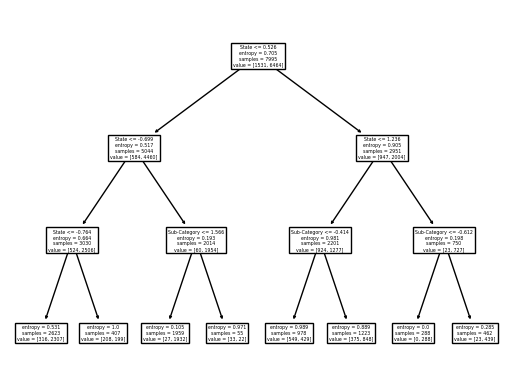

In [105]:
tree.plot_tree(clf,feature_names = list(ModelDataClass.columns.values))

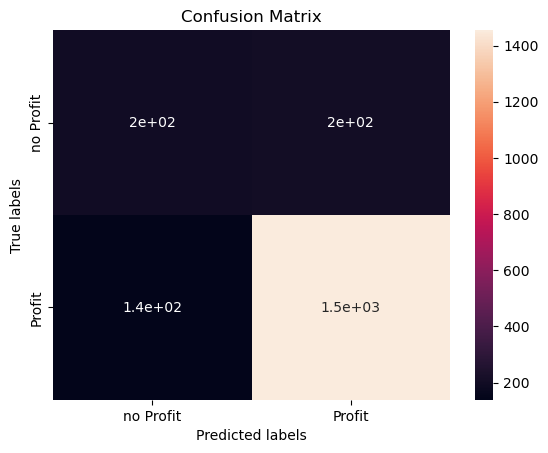

In [106]:
plot_confusion_matrix(y_test,predictions)

### RadomForest Generator
- Notes : The random Forest generator machine learning model performed exceptionally well compared to the other options, including the nearest neighbor and simple tree model. The model also did an excellent job of predicting non-profitable features. Which the other models struggle with

In [107]:
clf1 = RandomForestClassifier(n_estimators=1000)
clf1 = clf1.fit(x_train, y_train)

In [108]:
predictions = clf1.predict(x_test).ravel()

In [109]:
Tree_Accuracy_Score = accuracy_score(predictions,y_test)
Tree_JaccardIndex = jaccard_score(predictions,y_test)
Tree_F1_Score = f1_score(predictions,y_test)

print(Tree_Accuracy_Score)
print(Tree_JaccardIndex)
print(Tree_F1_Score)

0.927463731865933
0.9139976275207592
0.955066625348621


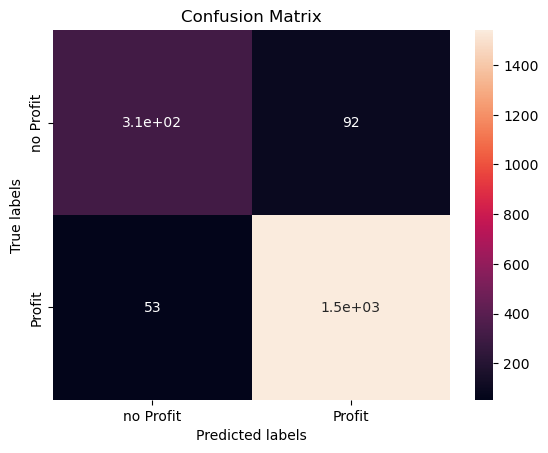

In [110]:
plot_confusion_matrix(y_test,predictions)

### Logstic Regression and SVM Model
- Motes: I am lumping these two models together because both performed equally poorly.  While their accuracy score was around 79%, the same percentage of profitable data meaning that all these models did was predict profitable.

In [111]:
parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
lr=LogisticRegression().fit(x_train,y_train)
logreg_cv = GridSearchCV(lr,param_grid = parameters,cv = 10).fit(x_train,y_train)

In [112]:
print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
accuracy : 0.8085053191489362


In [113]:
logreg_cv.score(x_test,y_test)

0.7973986993496749

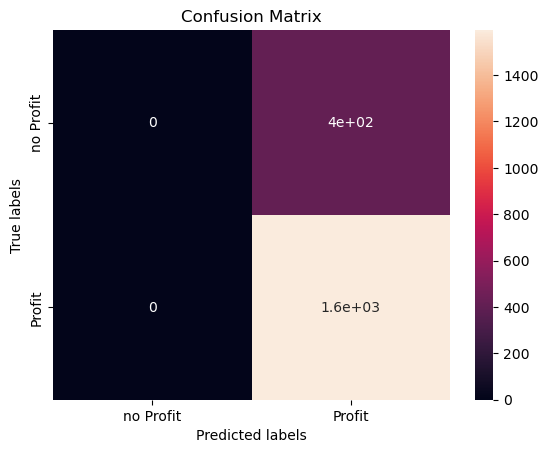

In [114]:
yhat=logreg_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)

In [115]:
svm = SVC(kernel='linear').fit(x_train,y_train)

In [116]:
yhat = svm.predict(x_test)

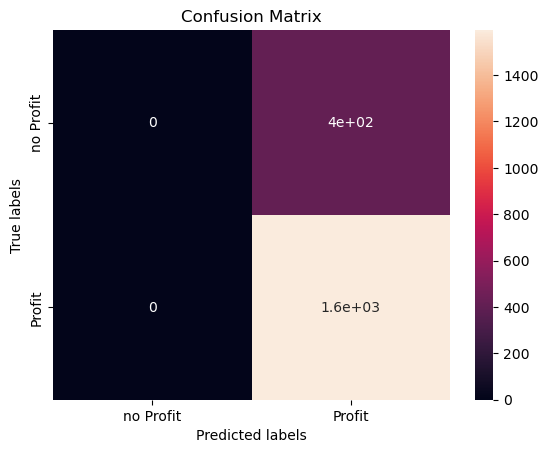

In [118]:
plot_confusion_matrix(y_test,yhat)

### KNN Model
- Notes : K nearest neighbor was the second most accurate model I trained, with an accurate accuracy score in the '90s. The model also does an excellent job of predicting nonprofitability.

In [120]:
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}
KNN = KNeighborsClassifier()

In [122]:
knn_cv = GridSearchCV(KNN,param_grid = parameters,cv = 10).fit(x_train,y_train)

In [123]:
print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
print("accuracy :",knn_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'algorithm': 'auto', 'n_neighbors': 1, 'p': 1}
accuracy : 0.9129446182728411


In [125]:
knn_cv.score(x_test,y_test)

0.9054527263631816

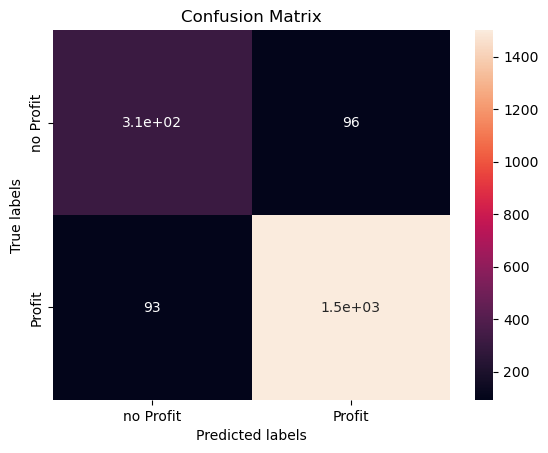

In [126]:
yhat = knn_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)

### Final Notes on Classification Models
- Notes: The random Forest decision tree model performs the best out of the five models tested, with K's nearest neighbor coming in second and third being the simple decision tree model. Therefore, I chose the random Forest decision tree as the primary model to determine profitability based on the stated parameters. 

## Data Cited Page
   - Folium Map US States Data:  https://github.com/python-visualization/folium/blob/main/tests/us-states.json?short_path=3036216
   - Super Market Sales Data : https://www.kaggle.com/datasets/vivek468/superstore-dataset-final